Bibliotecas

In [2]:
import os
import re
import rasterio
import os
import rasterio
from rasterio.mask import mask
import geopandas as gpd
from shapely.geometry import box
import shutil
import zipfile
from pathlib import Path

In [3]:
def is_directory_accessible(directory_path):
    """Check if a directory exists and is accessible."""
    path = Path(directory_path)
    return path.exists() and path.is_dir()

## Parâmetros

In [4]:
# Caminhos e arquivo de entrada
input_zip_file = r'/Volumes/Dados_na_nuvem/Marcelo/Mestrado PTR/pct1_h_files.zip'
output_folder = r'/Users/marcelofernandes/Library/CloudStorage/GoogleDrive-marcelo.fernandes@alumni.usp.br/.shortcut-targets-by-id/1M--OnzbTYagrNv5Ss9fjWlBxCMmasz-Y/10_Mestrado_2021_Marcelo Fernandes/9_Dissertação/Resultados'
pesquisa_OD = '/Users/marcelofernandes/Library/CloudStorage/GoogleDrive-marcelo.fernandes@alumni.usp.br/My Drive/Pesquisa OD 2017/OD-2017/Mapas-OD2017/Shape-OD2017/Zonas_2017_region.shp'
my_crs = '4326' # Verificar em EPSG.io um projeção que te dê o resultado em metros


if is_directory_accessible(input_zip_file):
    print(f"\nO diretório {input_zip_file} existe e é acessível.\n")
else:
    print(f"\nO diretório {input_zip_file} não é acessível\n")

if is_directory_accessible(output_folder):
    print(f"\nO diretório {output_folder} existe e é acessível.\n")
else:
    print(f"\nO diretório {output_folder} não é acessível\n")


O diretório /Volumes/Dados_na_nuvem/Marcelo/Mestrado PTR/pct1_h_files.zip não é acessível


O diretório /Users/marcelofernandes/Library/CloudStorage/GoogleDrive-marcelo.fernandes@alumni.usp.br/.shortcut-targets-by-id/1M--OnzbTYagrNv5Ss9fjWlBxCMmasz-Y/10_Mestrado_2021_Marcelo Fernandes/9_Dissertação/Resultados existe e é acessível.



In [14]:
# Parâmetros
pacote_num = 1          # Número do pacote a ser criado
bacia_nome = "Aricanduva"  # Nome da bacia

# Diretórios e configurações
pacote_path = os.path.join(output_folder, f"Pacote_{pacote_num:02d}")
raw_path = os.path.join(pacote_path, "Raw")
bacias_path = os.path.join(pacote_path, "Bacias", bacia_nome)
clipado_path = os.path.join(bacias_path, "Clipado") # Diretório para salvar os arquivos clipados

# Determinar os pixels acima do threshold
threshold = 70  # Valor informado em milímetros, mas convertido para metros, em função do raster. Valor obtido a partir da IC do Rodrigo.
threshold_max = 300 # Valor obtido a partir do paper da Pregnolato. Novamente, valor informado em milímetros, mas convertido para metros.

In [6]:
import osmnx as ox
import os

path_rede = '/Users/marcelofernandes/PycharmProjects/SP_urban_flooding/network_baseline_vel_updated.graphml'

# Verificar se o arquivo existe antes de tentar carregar
if os.path.exists(path_rede):
    try:
        G_baseline = ox.load_graphml(path_rede)
        print('\nGrafo carregado com sucesso!\n')
    except Exception as e:
        print(f'Erro ao carregar o grafo: {e}')
else:
    print('Arquivo não encontrado no caminho especificado.')


Grafo carregado com sucesso!



In [7]:
node_baseline, edges_baseline = ox.graph_to_gdfs(G_baseline)

In [15]:
filename = os.listdir(clipado_path)[5]

# Extrair informações do nome do arquivo
match = re.search(r'pct(?P<pct>\d+)_h(?:_max)?_(?P<value>\d+)_clp', filename)
if match:
    pct = match.group('pct')  # Valor após "pct"
    value = match.group('value')  # Valor numérico
    is_max = '_max' in filename  # Verificar se "max" está presente
            
# Criar o nome da coluna dinamicamente
column_suffix = f"pct{pct}_h_{value}" + ("_max" if is_max else "")
column_name = column_suffix  # Exemplo: "pct1_h_2692800" ou "pct1_h_max_2768400"
print(column_name)
            
# Caminho completo do arquivo raster
raster_path = os.path.join(clipado_path, filename)
print(raster_path)

pct1_h_2768400_max
/Users/marcelofernandes/Library/CloudStorage/GoogleDrive-marcelo.fernandes@alumni.usp.br/.shortcut-targets-by-id/1M--OnzbTYagrNv5Ss9fjWlBxCMmasz-Y/10_Mestrado_2021_Marcelo Fernandes/9_Dissertação/Resultados/Pacote_01/Bacias/Aricanduva/Clipado/pct1_h_max_2768400_clp.tif


In [8]:
def adjust_speed_batch(row, raster_data, transform, threshold, threshold_max, speed_column):
    """
    Ajusta a velocidade de um segmento com base na profundidade do alagamento extraída de um raster.

    Parâmetros:
        row (GeoSeries): Linha atual do GeoDataFrame contendo informações de velocidade e geometria.
        raster_data (numpy.ndarray): Dados do raster contendo profundidade de alagamento.
        transform (Affine): Transformação do raster para coordenadas espaciais.
        threshold (float): Profundidade mínima para ajustar a velocidade.
        threshold_max (float): Profundidade máxima que torna a via intransitável.
        speed_column (str): Nome da coluna de referência para a velocidade original.
    
    Retorno:
        float: Velocidade ajustada para o segmento.
    """

    # Encontrar a coordenada do centro do segmento
    centroid = row.geometry.centroid

    # Transformar as coordenadas do centroide em índices do raster
    try:
        col_idx, row_idx = ~transform * (centroid.x, centroid.y) # Observe a ordem inversa
        row_idx, col_idx = int(row_idx), int(col_idx)
    except Exception:
        # Caso algo dê errado na transformação, manter a velocidade original
        print('Mantive a velocidade que veio!')
        return row[speed_column]

    # Verificar se os índices estão dentro dos limites do raster
    if not (0 <= row_idx < raster_data.shape[0] and 0 <= col_idx < raster_data.shape[1]):
        print(row_idx, raster_data.shape[0], col_idx, raster_data.shape[1])
        return row[speed_column]
    
    # Extração do valor de profundidade do raster
    flood_depth = 1000*raster_data[row_idx, col_idx] # Valor extraído do raster em metros
    #print(flood_depth)

    # Ajustar a velocidade com base na profundidade
    if flood_depth > threshold_max:
        # Caso a altura exceda o limiar máximo, torna-se instransitável
        return 0
    elif flood_depth > threshold:
        # Aplicar a fórmula de ajuste da velocidade
        adjusted_speed = 0.0009 * (flood_depth ** 2) - 0.5529 * flood_depth + 86.9448
        print('Pregnolato!')
        return min(adjusted_speed, row[speed_column])  # Garantir que não ultrapasse a velocidade original
        
    # Caso contrário, manter a velocidade original
    return row[speed_column]

In [10]:
import geopandas as gpd

# Verificar o CRS atual
print("CRS atual:", edges_baseline.crs)

# Reprojetar para EPSG:31983
edges_baseline_reprojected = edges_baseline.to_crs(epsg=31983)

# Verificar se a reprojeção foi bem-sucedida
print("Novo CRS:", edges_baseline_reprojected.crs)

CRS atual: epsg:4326
Novo CRS: EPSG:31983


In [16]:
# Abrir o raster e extrair os dados
with rasterio.open(raster_path) as src:
    raster_data = src.read(1)  # Ler a primeira banda do raster
    raster_transform = src.transform

print(edges_baseline_reprojected.crs)  # CRS do GeoDataFrame
print(raster_transform)     # Esse não mostra o CRS, apenas a transformação
            
# Aplicar a função de ajuste e criar uma nova coluna
edges_baseline_reprojected[column_name] = edges_baseline_reprojected.apply(
    adjust_speed_batch,
    axis=1,
    args=(raster_data, raster_transform, threshold, threshold_max, 'speed_kph')
    )

EPSG:31983
| 29.16, 0.00, 338179.71|
| 0.00,-29.16, 7398602.34|
| 0.00, 0.00, 1.00|
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Pregnolato!
Preg

In [11]:
import folium

edges_baseline.explore(column="speed_kph",
    tooltip="speed_kph",
    popup=True,
    tiles="CartoDB dark_matter",
    cmap="inferno_r")

In [17]:
edges_baseline_reprojected.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 8333 entries, (np.int64(597447), np.int64(25778775), np.int64(0)) to (np.int64(12013065742), np.int64(1269523805), np.int64(0))
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   osmid               8333 non-null   object  
 1   oneway              8333 non-null   bool    
 2   lanes               7167 non-null   object  
 3   ref                 203 non-null    object  
 4   name                7047 non-null   object  
 5   highway             8333 non-null   object  
 6   maxspeed            2906 non-null   object  
 7   reversed            8333 non-null   object  
 8   length              8333 non-null   float64 
 9   geometry            8333 non-null   geometry
 10  speed_kph           8333 non-null   float64 
 11  bridge              270 non-null    object  
 12  access              37 non-null     object  
 13  tunnel              12 non

In [18]:
import pandas as pd
import numpy as np

# Definir os intervalos (bins) para agrupar os dados
bins = np.linspace(edges_baseline_reprojected["speed_kph"].min(), edges_baseline_reprojected["speed_kph"].max(), num=20)  # 10 intervalos

# Criar a tabela com a contagem de valores por intervalo
hist_speed = pd.cut(edges_baseline_reprojected["speed_kph"], bins=bins).value_counts().sort_index()
hist_pct = pd.cut(edges_baseline_reprojected["pct1_h_2768400_max"], bins=bins).value_counts().sort_index()

# Criar DataFrame comparativo
hist_table = pd.DataFrame({
    "Intervalo (km/h)": hist_speed.index.astype(str),
    "Freq. Speed_kph": hist_speed.values,
    "Freq. pct1_h_2768400_max": hist_pct.values
})

# Exibir a tabela
print(hist_table)


    Intervalo (km/h)  Freq. Speed_kph  Freq. pct1_h_2768400_max
0     (20.0, 23.684]                0                        26
1   (23.684, 27.368]                0                        29
2   (27.368, 31.053]               78                        85
3   (31.053, 34.737]                0                        23
4   (34.737, 38.421]                6                        42
5   (38.421, 42.105]             3640                      3210
6   (42.105, 45.789]               36                        37
7   (45.789, 49.474]                0                        13
8   (49.474, 53.158]             4270                      3668
9   (53.158, 56.842]                4                         4
10  (56.842, 60.526]              260                       247
11  (60.526, 64.211]                0                         0
12  (64.211, 67.895]               10                        10
13  (67.895, 71.579]                7                         6
14  (71.579, 75.263]                0   

### Calculando os caminhos mínimos

In [19]:
def add_edge_travel_times(gdf, column_name):
    # Criar o nome da nova coluna
    new_column_name = f'TV_{column_name}' # TV é tempo de viagem
    
    for idx, row in gdf.iterrows():
        length = row['length']
        speed = row.get(column_name)  # Usar a coluna fornecida
        
        if speed == 0:
            travel_time = float('inf')  # Indica que o tempo de viagem é infinito
        else:
            travel_time = (length / (speed / 3.6))  # Convertendo para segundos
        
        # Armazenar o tempo de viagem na nova coluna
        gdf.at[idx, new_column_name] = travel_time
    return gdf

In [20]:

# Adicionar velocidade aos eixos e calcular o tempo de viagem
edges_baseline_reprojected = add_edge_travel_times(edges_baseline_reprojected, 'speed_kph')

In [21]:
# Adicionar velocidade aos eixos e calcular o tempo de viagem
edges_baseline_reprojected = add_edge_travel_times(edges_baseline_reprojected, 'pct1_h_2768400_max')

In [22]:
edges_baseline_reprojected.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 8333 entries, (np.int64(597447), np.int64(25778775), np.int64(0)) to (np.int64(12013065742), np.int64(1269523805), np.int64(0))
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   osmid                  8333 non-null   object  
 1   oneway                 8333 non-null   bool    
 2   lanes                  7167 non-null   object  
 3   ref                    203 non-null    object  
 4   name                   7047 non-null   object  
 5   highway                8333 non-null   object  
 6   maxspeed               2906 non-null   object  
 7   reversed               8333 non-null   object  
 8   length                 8333 non-null   float64 
 9   geometry               8333 non-null   geometry
 10  speed_kph              8333 non-null   float64 
 11  bridge                 270 non-null    object  
 12  access                 37 non-null

In [23]:
(edges_baseline_reprojected['speed_kph']==0).sum()

np.int64(0)

## Carregar os pontos da Pesquisa OD do Metro

In [24]:
# Read the shapefile
gdf_OD = gpd.read_file(pesquisa_OD)

# Verifica o sistema de coordenadas
gdf_OD.crs

# Atribuição do esquema de projeção
gdf_OD = gdf_OD.to_crs(31983)

# Filtrando para o munícipio de São Paulo
gdf_indices=gdf_OD.index[gdf_OD['NomeMunici']=='São Paulo']
gdf_OD_SP = gdf_OD.loc[gdf_indices]

# Obtendo os centroides
gdf_OD_SP["centroid"] = gdf_OD_SP["geometry"].centroid

gdf_OD_SP['centroid'].explore(
#                            column = "NumeroZona",
#                            tooltip = "NumeroZona",
#                            popup = True,
#                            tiles = "CartoDB dark_matter",
#                            cmap = "inferno_r")
    )

Text(0.5, 1.0, 'Sobreposição da rede viária das bacias versus centróides OD')

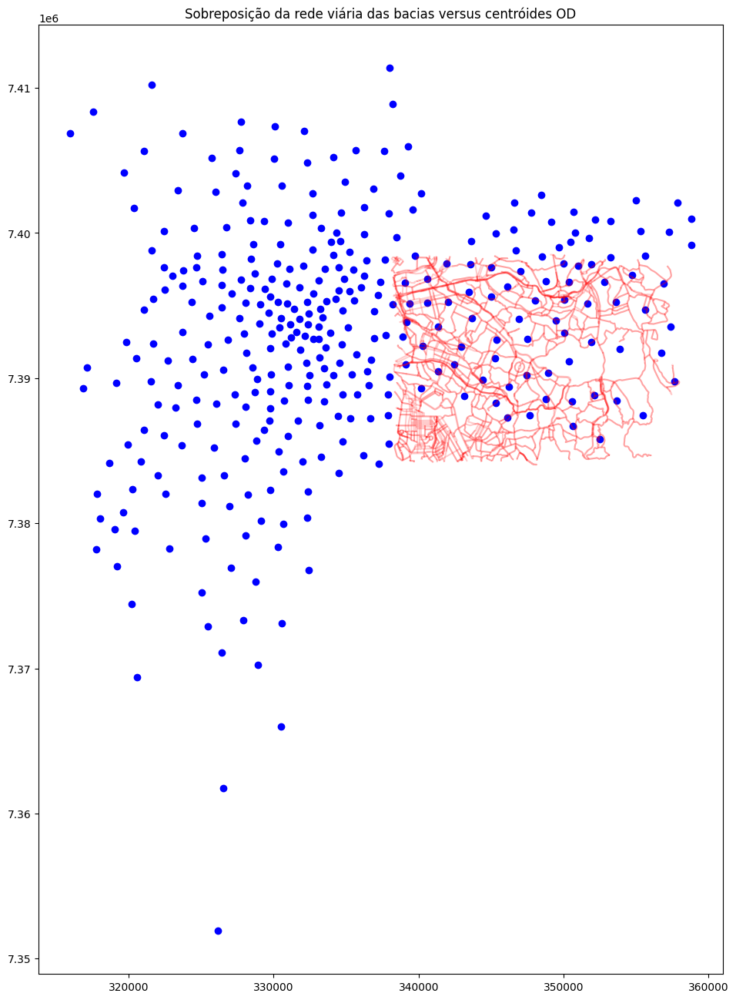

In [25]:
base = gdf_OD_SP['centroid'].plot(figsize=(16,16), color='blue')
edges_baseline_reprojected.plot(ax=base, color='red', alpha=0.2)
base.set_title('Sobreposição da rede viária das bacias versus centróides OD')

In [26]:
import os
import geopandas as gpd

# Caminho do arquivo
path = '/Users/marcelofernandes/PycharmProjects/SP_urban_flooding/bounding_box_bacia.json'

# Verificar se o arquivo existe
if os.path.exists(path):
    print("Arquivo encontrado!")
    if os.access(path, os.R_OK):
        try:
            # Tentar carregar com GeoPandas
            bounding_box_baseline = gpd.read_file(path)
            print("\nBounding box carregado com sucesso!\n")
        except Exception as e:
            print(f"Erro ao carregar o bounding box com GeoPandas: {e}")
    else:
        print("Arquivo encontrado, mas sem permissão de leitura!")
else:
    print("Arquivo não encontrado!")

Arquivo encontrado!

Bounding box carregado com sucesso!



In [28]:
bounding_box_baseline = bounding_box_baseline.to_crs(31983)

(65, 3)

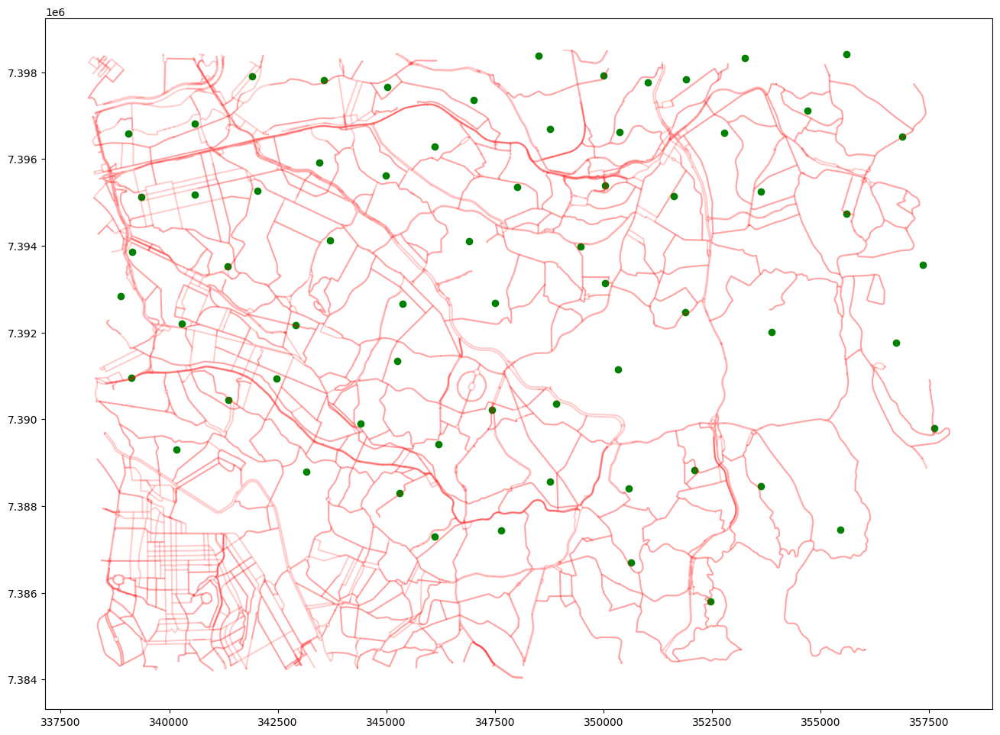

In [29]:
centroides_df = gpd.GeoDataFrame(gdf_OD_SP[['NumeroZona', 'NomeZona']], geometry=gdf_OD_SP['centroid'])
centroides_dentro = gpd.sjoin(centroides_df, bounding_box_baseline, how='inner', predicate='within')

# Remover a coluna de índice criada pelo sjoin
centroides_dentro = centroides_dentro.drop(columns=['index_right'])

# Redefinir o índice
centroides_dentro = centroides_dentro.reset_index(drop=True)

base2 = centroides_dentro.plot(color='green', figsize=(16,16))
edges_baseline_reprojected.plot(ax=base2, color='red', alpha=0.2)

centroides_dentro.shape

In [30]:
import geopandas as gpd
from shapely.ops import nearest_points


In [32]:
# 1. Aproximar os pontos de centroides_dentro à rede
centroides_dentro['nearest_node'] = centroides_dentro['geometry'].apply(
    lambda point: ox.distance.nearest_nodes(G_baseline, point.x, point.y)
)

<Axes: >

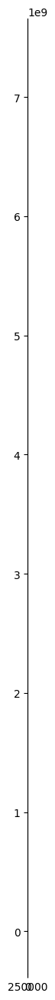

In [35]:
base2 = centroides_dentro.plot(color='green', figsize=(16,16))
edges_baseline_reprojected.plot(ax=base2, color='red', alpha=0.2)
#centroides_dentro['nearest_node'].plot(ax=base2, color='blue', alpha=0.2)

In [ ]:

# 2. Adicionar velocidade aos eixos
G2 = ox.add_edge_travel_times(G2)  # Adiciona o tempo de viagem (segundos)

In [115]:

def find_nearest_node(gdf, nodes_gdf):
    # Ensure both inputs are GeoDataFrames
    if not isinstance(gdf, gpd.GeoDataFrame) or not isinstance(nodes_gdf, gpd.GeoDataFrame):
        raise TypeError("Both inputs must be GeoDataFrames")
    
    # Ensure they have the same CRS
    if gdf.crs != nodes_gdf.crs:
        raise ValueError("Both GeoDataFrames must have the same CRS")
    
    def nearest_node(point):
        if not isinstance(point, (shapely.geometry.Point, shapely.geometry.MultiPoint)):
            print(f"Warning: Invalid geometry type: {type(point)}")
            return None
        
        # Calculate distances to all nodes
        distances = nodes_gdf.geometry.distance(point)
        
        # Find the index of the nearest node
        nearest_idx = distances.idxmin()
        
        # Return the geometry of the nearest node
        return nodes_gdf.loc[nearest_idx, 'geometry']
    
    # Make a copy to avoid modifying the original
    result = gdf.copy()
    
    # Apply the function safely
    result['nearest_node'] = result['geometry'].apply(lambda x: nearest_node(x) if x is not None else None)
    
    return result

In [114]:
# Ensure geometries are valid
centroides_dentro = centroides_dentro[centroides_dentro.geometry.is_valid]
node_baseline = node_baseline[node_baseline.geometry.is_valid]

# Make sure both have the same CRS
if centroides_dentro.crs != node_baseline.crs:
    centroides_dentro = centroides_dentro.to_crs(node_baseline.crs)

In [116]:
centroides_dentro = find_nearest_node(centroides_dentro, node_baseline)

NameError: name 'shapely' is not defined

In [62]:
import networkx as nx
from networkx.classes.function import path_weight

# Definição da função para encontrar o caminho mínimo
def caminho_minimo(G, source, target, weight):
    # Encontrar o caminho mais curto
    path = nx.shortest_path(G, source=source, target=target, weight=weight)
    path_cost = path_weight(G, path, weight=weight)
    return path, path_cost

In [68]:
from itertools import combinations
from itertools import product
import itertools

In [69]:
# 2. Calcular o caminho mínimo e o tempo de viagem ponderado entre todos os pontos dois a dois
data = []
ponderado_rain = True

for node1, node2 in itertools.product(centroides_dentro_reproj['nearest_node_rain'], repeat=2):
    if node1 == node2:
        continue  # Ignorar pares onde origem e destino são iguais
    try:
        # Obter o número de viagens entre node1 e node2
        num_trips = get_number_of_trips_rain(node1, node2, matriz_od_25)
        
        if num_trips > 0:
            # Calcular o caminho mínimo pelo tempo de viagem ponderado
            if node1 in G6_mod.nodes and node2 in G6_mod.nodes:
                # Calcular o caminho mais curto
                #caminho_base, tempo_base = caminho_minimo(G3_mod, node1, node2, 'travel_time_baseline')
                caminho_com, tempo_com = caminho_minimo(G6_mod, node1, node2, 'travel_time_rain')
                weighted_time_rain = tempo_com * num_trips
                if tempo_com == 'inf':
                    print(f'Nó origem: {node1}, nó destino: {node2}, percurso: {len(caminho_com)} nós')
                #weighted_time_baseline = tempo_base * num_trips
            else:
                print(f"Nó(s) {node1} ou {node2} não encontrado(s) no grafo.")
                continue
            data.append({
                'index': len(data) + 1,
                'Origem': node1,
                'Destino': node2,
                'Num_viagens': num_trips,
                #'Tempo baseline (min)': tempo_base/60,
                #'Nós baseline': len(caminho_base),
                'Tempo com chuva (min)': tempo_com/60,
                'Nós com chuva':len(caminho_com),
                'Tempo ponderado com chuva (min)':weighted_time_rain/60,
                #'Tempo ponderado sem chuva (min)':weighted_time_baseline/60
            })

    except nx.NetworkXNoPath:
        # Se não houver caminho entre os nós, ignore esse par
        continue

# Criar DataFrame
tempos_e_viagens = pd.DataFrame(data)

NameError: name 'centroides_dentro_reproj' is not defined